In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/spring

/content/drive/.shortcut-targets-by-id/142gyd0COn2YExYtLVzVzK0seNiawv1QG/spring


In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 25.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 66.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 75.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.

In [ ]:
import numpy as np
from numpy import ndarray
import torch
import torch.nn as nn
import torch.optim as optim
import os
import cv2
import random
import json
from PIL import Image
from torchvision.transforms import Resize, ConvertImageDtype, Normalize
from torchvision.transforms import functional as F_vision
import torch.nn.functional as F
from torch import Tensor
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, datasets
from torchsummary import summary
from collections import namedtuple
from typing import Optional, Tuple, Any
import matplotlib.pyplot as plt

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [ ]:
# Building the initial Convolutional Block
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding):
        super(ConvBlock, self).__init__()

        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.activation(x)
        return x

class Inception(nn.Module):
    def __init__(
        self,
        in_channels,
        num1x1,
        num3x3_reduce,
        num3x3,
        num5x5_reduce,
        num5x5,
        pool_proj,
    ):
        super(Inception, self).__init__()

        # Four output channel for each parallel block of network
        # Note, within Inception the individual blocks are running parallely
        # NOT sequentially.
        self.block1 = nn.Sequential(
            ConvBlock(in_channels, num1x1, kernel_size=1, stride=1, padding=0)
        )

        self.block2 = nn.Sequential(
            ConvBlock(in_channels, num3x3_reduce, kernel_size=1, stride=1, padding=0),
            ConvBlock(num3x3_reduce, num3x3, kernel_size=3, stride=1, padding=1),
        )

        self.block3 = nn.Sequential(
            ConvBlock(in_channels, num5x5_reduce, kernel_size=1, stride=1, padding=0),
            ConvBlock(num5x5_reduce, num5x5, kernel_size=5, stride=1, padding=2),
        )

        self.block4 = nn.Sequential(
            nn.MaxPool2d(3, stride=1, padding=1, ceil_mode=True),
            ConvBlock(in_channels, pool_proj, kernel_size=1, stride=1, padding=0),
        )

    def forward(self, x):
        # Note the different way this forward function
        # calculates the output.
        block1 = self.block1(x)
        block2 = self.block2(x)
        block3 = self.block3(x)
        block4 = self.block4(x)

        return torch.cat([block1, block2, block3, block4], 1)


class Auxiliary(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(Auxiliary, self).__init__()

        self.pool = nn.AdaptiveAvgPool2d((4, 4))
        self.conv = nn.Conv2d(in_channels, 128, kernel_size=1, stride=1, padding=0)
        self.activation = nn.ReLU()

        self.fc1 = nn.Linear(2048, 1024)
        self.dropout = nn.Dropout(0.7)
        self.fc2 = nn.Linear(1024, num_classes)

    def forward(self, x):
        out = self.pool(x)

        out = self.conv(out)
        out = self.activation(out)
        #print('out shape is  ', out.shape)
        # out shape is  torch.Size([2, 128, 4, 4])

        out = torch.flatten(out, 1)

        out = self.fc1(out)
        out = self.activation(out)
        out = self.dropout(out)

        out = self.fc2(out)

        return out


class GoogLeNet(nn.Module):
    def __init__(self, num_classes=10):
        super(GoogLeNet, self).__init__()

        self.conv1 = ConvBlock(3, 64, kernel_size=7, stride=2, padding=3)
        self.pool1 = nn.MaxPool2d(3, stride=2, padding=0, ceil_mode=True)
        self.conv2 = ConvBlock(64, 64, kernel_size=1, stride=1, padding=0)
        self.conv3 = ConvBlock(64, 192, kernel_size=3, stride=1, padding=1)
        self.pool3 = nn.MaxPool2d(3, stride=2, padding=0, ceil_mode=True)

        self.inception3A = Inception(
            in_channels=192,
            num1x1=64,
            num3x3_reduce=96,
            num3x3=128,
            num5x5_reduce=16,
            num5x5=32,
            pool_proj=32,
        )
        self.inception3B = Inception(
            in_channels=256,
            num1x1=128,
            num3x3_reduce=128,
            num3x3=192,
            num5x5_reduce=32,
            num5x5=96,
            pool_proj=64,
        )
        self.pool4 = nn.MaxPool2d(3, stride=2, padding=0, ceil_mode=True)

        self.inception4A = Inception(
            in_channels=480,
            num1x1=192,
            num3x3_reduce=96,
            num3x3=208,
            num5x5_reduce=16,
            num5x5=48,
            pool_proj=64,
        )
        self.inception4B = Inception(
            in_channels=512,
            num1x1=160,
            num3x3_reduce=112,
            num3x3=224,
            num5x5_reduce=24,
            num5x5=64,
            pool_proj=64,
        )
        self.inception4C = Inception(
            in_channels=512,
            num1x1=128,
            num3x3_reduce=128,
            num3x3=256,
            num5x5_reduce=24,
            num5x5=64,
            pool_proj=64,
        )
        self.inception4D = Inception(
            in_channels=512,
            num1x1=112,
            num3x3_reduce=144,
            num3x3=288,
            num5x5_reduce=32,
            num5x5=64,
            pool_proj=64,
        )
        self.inception4E = Inception(
            in_channels=528,
            num1x1=256,
            num3x3_reduce=160,
            num3x3=320,
            num5x5_reduce=32,
            num5x5=128,
            pool_proj=128,
        )
        self.pool5 = nn.MaxPool2d(3, stride=2, padding=0, ceil_mode=True)

        self.inception5A = Inception(
            in_channels=832,
            num1x1=256,
            num3x3_reduce=160,
            num3x3=320,
            num5x5_reduce=32,
            num5x5=128,
            pool_proj=128,
        )
        self.inception5B = Inception(
            in_channels=832,
            num1x1=384,
            num3x3_reduce=192,
            num3x3=384,
            num5x5_reduce=48,
            num5x5=128,
            pool_proj=128,
        )
        self.pool6 = nn.AdaptiveAvgPool2d((1, 1))

        self.dropout = nn.Dropout(0.4)
        self.fc = nn.Linear(1024, num_classes)

        self.aux4A = Auxiliary(512, num_classes)
        self.aux4D = Auxiliary(528, num_classes)
        self.last_conv_layer = None

    def forward(self, x):
        out = self.conv1(x)
        out = self.pool1(out)
        out = self.conv2(out)
        out = self.conv3(out)
        out = self.pool3(out)
        out = self.inception3A(out)
        out = self.inception3B(out)
        out = self.pool4(out)
        out = self.inception4A(out)

        aux1 = self.aux4A(out)

        out = self.inception4B(out)
        out = self.inception4C(out)
        out = self.inception4D(out)

        aux2 = self.aux4D(out)

        out = self.inception4E(out)
        out = self.pool5(out)
        out = self.inception5A(out)
        out = self.inception5B(out)
        self.last_conv_layer = out
        out = self.pool6(out)
        out = torch.flatten(out, 1)
        out = self.dropout(out)
        out = self.fc(out)

        return out, aux1, aux2


In [ ]:
model = GoogLeNet()

model.to(device)
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,472
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         ConvBlock-4         [-1, 64, 112, 112]               0
         MaxPool2d-5           [-1, 64, 56, 56]               0
            Conv2d-6           [-1, 64, 56, 56]           4,160
       BatchNorm2d-7           [-1, 64, 56, 56]             128
              ReLU-8           [-1, 64, 56, 56]               0
         ConvBlock-9           [-1, 64, 56, 56]               0
           Conv2d-10          [-1, 192, 56, 56]         110,784
      BatchNorm2d-11          [-1, 192, 56, 56]             384
             ReLU-12          [-1, 192, 56, 56]               0
        ConvBlock-13          [-1, 192, 56, 56]               0
        MaxPool2d-14          [-1, 192,

In [ ]:
def cifar_dataloader():

    transform = transforms.Compose([transforms.ToTensor(),
                                    transforms.Resize([224, 224]),
                                    transforms.RandomHorizontalFlip(p=0.5),
                                    transforms.Normalize(mean=[0.5], std=[0.5])])

    # Input Data in Google Drive
    train_dataset = datasets.CIFAR10('/content/drive/MyDrive/All_Datasets/CIFAR10', train=True, download=True, transform=transform)

    test_dataset = datasets.CIFAR10('/content/drive/MyDrive/All_Datasets/CIFAR10', train=False, download=True, transform=transform)

    # Split dataset into training set and validation set.
    train_dataset, val_dataset = random_split(train_dataset, (45000, 5000))

    print("Image shape of a random sample image : {}".format(train_dataset[0][0].numpy().shape), end = '\n\n')

    print("Training Set:   {} images".format(len(train_dataset)))
    print("Validation Set:   {} images".format(len(val_dataset)))
    print("Test Set:       {} images".format(len(test_dataset)))

    BATCH_SIZE = 128

    # Generate dataloader
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)

    return train_loader, val_loader, test_loader

In [ ]:
train_loader, val_loader, test_loader = cifar_dataloader()

Files already downloaded and verified
Files already downloaded and verified
Image shape of a random sample image : (3, 224, 224)

Training Set:   45000 images
Validation Set:   5000 images
Test Set:       10000 images


In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer):
    EPOCHS = 15
    train_samples_num = 45000
    val_samples_num = 5000

    train_epoch_loss_history, val_epoch_loss_history = [], []
    results = {}

    for epoch in range(EPOCHS):

        train_running_loss = 0
        correct_train = 0

        model.train().cuda()

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            """ for every mini-batch during the training phase, we
            typically want to explicitly set the gradients
            to zero before starting to do backpropragation """
            optimizer.zero_grad()

            # Start the forward pass
            prediction0, aux_pred_1, aux_pred_2 = model(inputs)

            # Compute the loss.
            real_loss = criterion(prediction0, labels)
            aux_loss_1 = criterion(aux_pred_1, labels)
            aux_loss_2 = criterion(aux_pred_2, labels)

            loss = real_loss + 0.3 * aux_loss_1 + 0.3 * aux_loss_2

            # do backpropagation and update weights with step()# Backward pass.
            loss.backward()
            optimizer.step()

            # Update the running corrects
            _, predicted = torch.max(prediction0.data, 1)

            correct_train += (predicted == labels).float().sum().item()

            """ Compute batch loss
            multiply each average batch loss with batch-length.
            The batch-length is inputs.size(0) which gives the number total images in each batch.
            Essentially I am un-averaging the previously calculated Loss """
            train_running_loss += loss.data.item() * inputs.shape[0]

        train_epoch_loss = train_running_loss / train_samples_num

        train_epoch_loss_history.append(train_epoch_loss)

        train_acc = correct_train / train_samples_num

        val_loss = 0
        correct_val = 0

        model.eval().cuda()

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)

                # Forward pass.
                prediction0, aux_pred_1, aux_pred_2 = model(inputs)

                # Compute the loss.
                real_loss = criterion(prediction0, labels)
                aux_loss_1 = criterion(aux_pred_1, labels)
                aux_loss_2 = criterion(aux_pred_2, labels)

                loss = real_loss + 0.3 * aux_loss_1 + 0.3 * aux_loss_2

                # Compute training accuracy.
                _, predicted = torch.max(prediction0.data, 1)
                correct_val += (predicted == labels).float().sum().item()

                # Compute batch loss.
                val_loss += loss.data.item() * inputs.shape[0]

            val_loss /= val_samples_num
            val_epoch_loss_history.append(val_loss)
            val_acc = correct_val / val_samples_num

        info = "[For Epoch {}/{}]: train-loss = {:0.5f} | train-acc = {:0.3f} | val-loss = {:0.5f} | val-acc = {:0.3f}"

        print(
            info.format(
                epoch + 1, EPOCHS, train_epoch_loss, train_acc, val_loss, val_acc
            )
        )

        results[epoch + 1] = [train_epoch_loss, train_acc, val_loss, val_acc]

        torch.save(
            model.state_dict(), "/content/drive/MyDrive/spring/checkpoints_lr005_input96/checkpoint{}".format(epoch + 1)
        )

    with open('/content/drive/MyDrive/spring/result_lr005_input96.json', 'w') as json_file:
      json.dump(results, json_file)

    torch.save(model.state_dict(), "/content/drive/MyDrive/spring/googlenet_model_lr005_input96")

    return train_epoch_loss_history, val_epoch_loss_history

In [ ]:
model_lr = 0.05
model_momentum = 0.9
model_weight_decay = 2e-05

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(),
                          lr=model_lr,
                          momentum=model_momentum,
                          weight_decay=model_weight_decay)

In [ ]:
train_epoch_loss_history, val_epoch_loss_history = train_model(model, train_loader, val_loader, criterion, optimizer)

[For Epoch 1/15]: train-loss = 2.80318 | train-acc = 0.379 | val-loss = 2.23579 | val-acc = 0.505
[For Epoch 2/15]: train-loss = 1.93466 | train-acc = 0.573 | val-loss = 1.82099 | val-acc = 0.586
[For Epoch 3/15]: train-loss = 1.52180 | train-acc = 0.673 | val-loss = 1.42090 | val-acc = 0.688
[For Epoch 4/15]: train-loss = 1.26452 | train-acc = 0.730 | val-loss = 1.85062 | val-acc = 0.623
[For Epoch 5/15]: train-loss = 1.08232 | train-acc = 0.771 | val-loss = 1.05053 | val-acc = 0.775
[For Epoch 6/15]: train-loss = 0.92293 | train-acc = 0.807 | val-loss = 1.01111 | val-acc = 0.780
[For Epoch 7/15]: train-loss = 0.81559 | train-acc = 0.829 | val-loss = 1.57293 | val-acc = 0.688
[For Epoch 8/15]: train-loss = 0.73474 | train-acc = 0.848 | val-loss = 0.98693 | val-acc = 0.797
[For Epoch 9/15]: train-loss = 0.64232 | train-acc = 0.866 | val-loss = 0.93892 | val-acc = 0.802
[For Epoch 10/15]: train-loss = 0.58590 | train-acc = 0.879 | val-loss = 0.80642 | val-acc = 0.832
[For Epoch 11/15]: 

In [ ]:
num_test_samples = 10000
correct = 0
model = GoogLeNet()
model.load_state_dict(torch.load('/content/drive/MyDrive/spring/googlenet_model2'))

model.eval().cuda()

with  torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # Make predictions.
        prediction, _, _ = model(inputs)

        # Retrieve predictions indexes.
        _, predicted_class = torch.max(prediction.data, 1)

        # Compute number of correct predictions.
        correct += (predicted_class == labels).float().sum().item()

test_accuracy = correct / num_test_samples

print('Test accuracy: {}'.format(test_accuracy))

Test accuracy: 0.8616


In [ ]:
def DrawLossandAccuracyCurve(json_file):
  with open(json_file, 'r') as file:
    # Load the JSON data as a dictionary
    data = json.load(file)
  epoch = [int(num) for num in list(data.keys())]
  train_loss = [train_loss[0] for train_loss in list(data.values())]
  train_acc = [train_acc[1] for train_acc in list(data.values())]
  val_loss = [val_loss[2] for val_loss in list(data.values())]
  val_acc = [val_acc[3] for val_acc in list(data.values())]
  fig = plt.figure()
  plt.plot(epoch, train_loss, color='blue')
  plt.plot(epoch, val_loss, color='red')

  plt.legend(['train loss', 'val loss'], loc='upper right')
  plt.xlabel('epoch')
  plt.ylabel('Loss')

  print('\n')

  fig = plt.figure()
  plt.plot(epoch, train_acc, color='blue')
  plt.plot(epoch, val_acc, color='red')

  plt.legend(['train acc', 'val acc'], loc='upper right')
  plt.xlabel('epoch')
  plt.ylabel('Accuracy')



## Input size = 32x32
## lr = 0.001
## optim = Adam

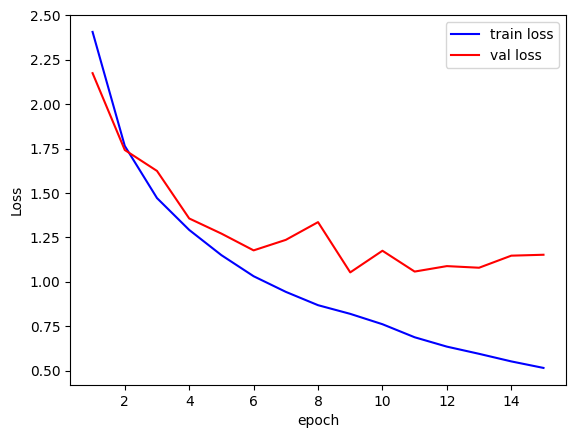

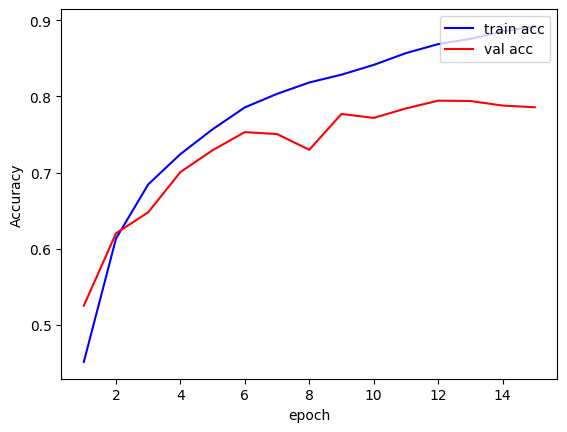

In [ ]:
DrawLossandAccuracyCurve('/content/drive/MyDrive/spring/result01.json')

## input size = 224 x 224
## lr = 0.1
## optim = SGD, momentum = 0.9
## weight decay = 2e-05

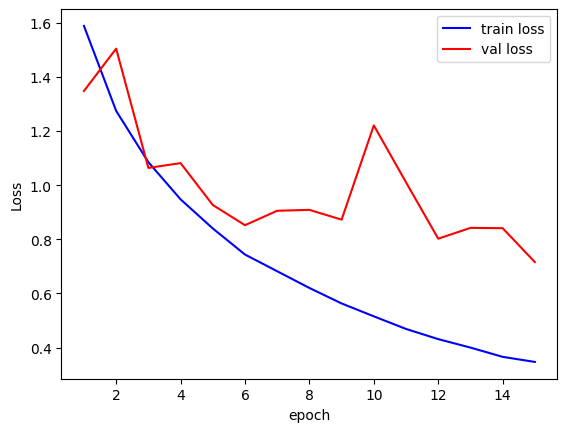

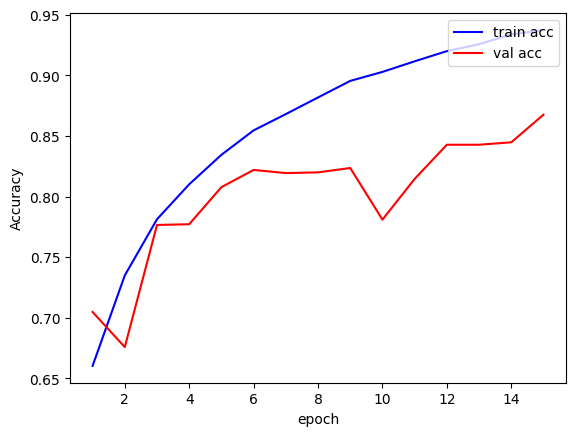

In [ ]:
DrawLossandAccuracyCurve('/content/drive/MyDrive/spring/result02.json')

## Input size = 96x96
## lr = 0.05
## optim = SGD momentum = 0.9
## weight decay = 2e-05

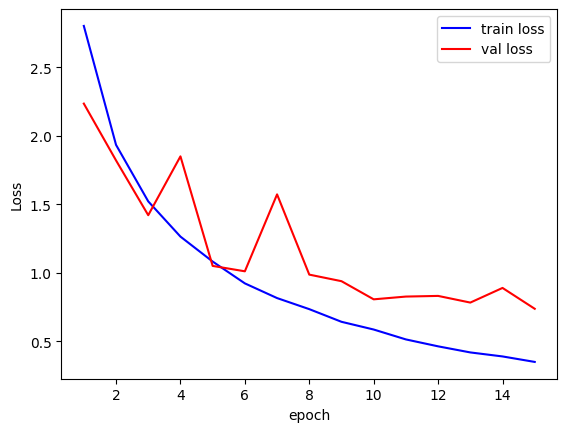

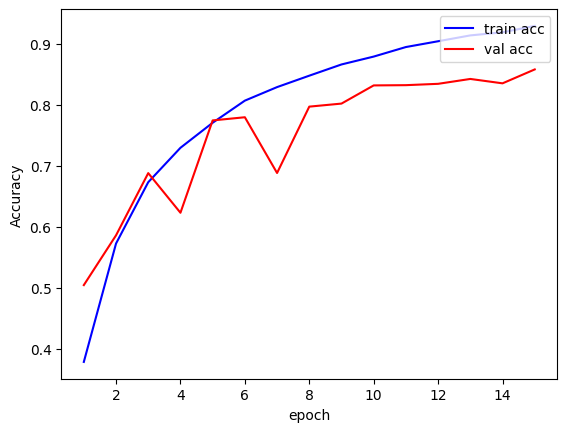

In [ ]:
DrawLossandAccuracyCurve('/content/drive/MyDrive/spring/result_lr005_input96.json')

#use GradCam

In [ ]:
def tensor_to_image(tensor: torch.Tensor, range_norm: bool, half: bool) -> Any:
    """Convert the Tensor(NCWH) data type supported by PyTorch to the np.ndarray(WHC) image data type

    Args:
        tensor (torch.Tensor): Data types supported by PyTorch (NCHW), the data range is [0, 1]
        range_norm (bool): Scale [-1, 1] data to between [0, 1]
        half (bool): Whether to convert torch.float32 similarly to torch.half type.

    Returns:
        image (np.ndarray): Data types supported by PIL or OpenCV

    Examples:
        >>> example_tensor = torch.randn([1,3, 256, 256], dtype=torch.float)
        >>> example_image = tensor_to_image(example_tensor, False, False)

    """
    # Scale the image data from [-1, 1] to [0, 1]
    if range_norm:
        tensor = tensor.add(1.0).div(2.0)

    # Convert torch.float32 image data type to torch.half image data type
    if half:
        tensor = tensor.half()

    image = tensor.squeeze(0).permute(1, 2, 0).mul(255).clamp(0, 255).cpu().numpy().astype("uint8")

    return image

In [ ]:
classes = ['airplane',
            'automobile',
            'bird',
            'cat',
            'deer',
            'dog',
            'frog',
            'horse',
            'ship',
            'truck']

In [ ]:
selected_images = {}
# Set the random seed for reproducibility
random.seed(42)
transform = transforms.Compose([transforms.ToTensor(),
                                    transforms.RandomHorizontalFlip(p=0.5),
                                    transforms.Normalize(mean=[0.5], std=[0.5])])

test_dataset = datasets.CIFAR10('/content/drive/MyDrive/All_Datasets/CIFAR10', train=False, download=True, transform=transform)

# Iterate over each class
for class_label in range(10):  # There are 10 classes in CIFAR-10
    indices = np.where(np.array(test_dataset.targets) == class_label)[0]  # Find indices of images belonging to the current class
    selected_indices = random.sample(list(indices), k=5)  # Randomly select 5 indices
    for i in selected_indices:
      selected_images[test_dataset[i]] = class_label  # Add the selected images to the list

Files already downloaded and verified


In [ ]:
len(selected_images)

50

In [ ]:
model = GoogLeNet()
model.load_state_dict(torch.load('/content/drive/MyDrive/spring/googlenet_model'))

<All keys matched successfully>

In [ ]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

target_layers = [model.inception5B]
cam = GradCAM(model=model, target_layers=target_layers)

images_and_grad = []
model.eval().cuda()

for key, value in selected_images.items():
  resized_tensor = F.interpolate(key[0].unsqueeze(0), size=(32, 32))

  label = value
  input_tensor = resized_tensor

  targets = [ClassifierOutputTarget(label)]
  grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
  grayscale_cam = grayscale_cam[0, :]

  input_image = tensor_to_image(key[0], False, False)
  input_image = input_image.astype(np.float32) / 255.0
  input_image = cv2.resize(input_image, (32, 32))

  visualization = show_cam_on_image(input_image, grayscale_cam, use_rgb=True)

  prediction, _, _ = model(resized_tensor.to(device))
  _, predicted_class = torch.max(prediction.data, 1)

  images_and_grad.append([label, input_image, visualization, predicted_class.cpu().numpy()[0]])

  model_outputs = cam.outputs

In [ ]:
def DrawGradcamImgs(className):
  count = 0
  print(className)
  fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(12, 6))
  for item in images_and_grad:
    if item[0] == classes.index(className):
      axes[0, count].imshow(item[1])
      axes[0, count].axis('off')
      axes[1, count].imshow(item[2])
      axes[1, count].axis('off')
      count += 1
      prediction_label = classes[item[3]]  # Replace this with your own function to obtain the predicted label
      axes[1, count-1].text(0.5, -0.15, prediction_label, transform=axes[1, count-1].transAxes,
                                horizontalalignment='center', verticalalignment='center')
  plt.tight_layout()

  # Show the plot
  plt.show()

## Input size = 32x32
## lr = 0.001
## optim = Adam

airplane


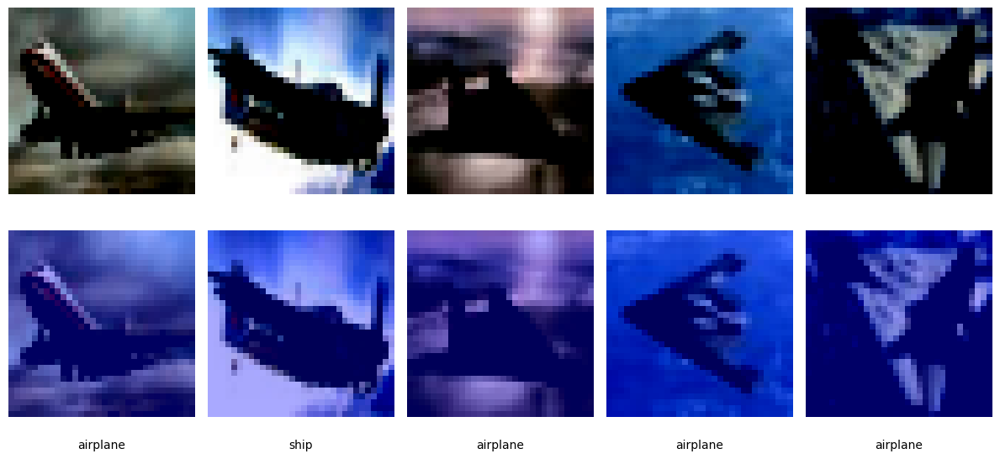



automobile


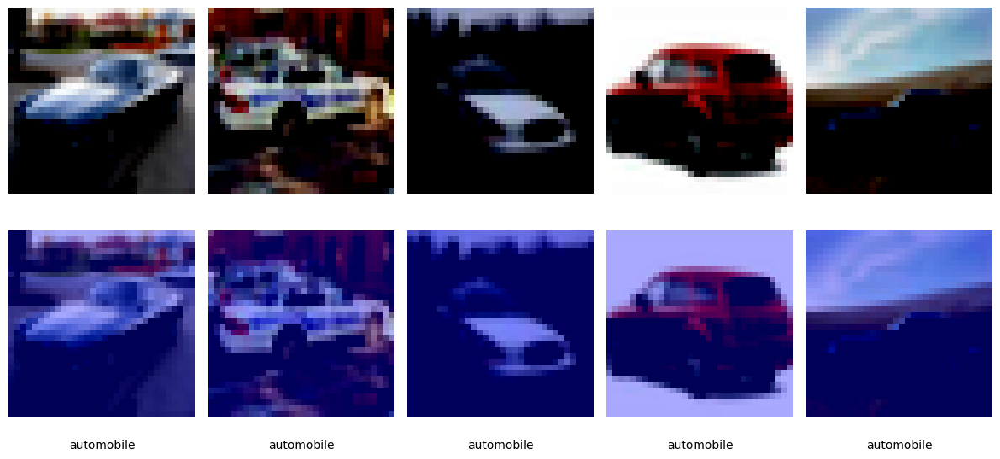



bird


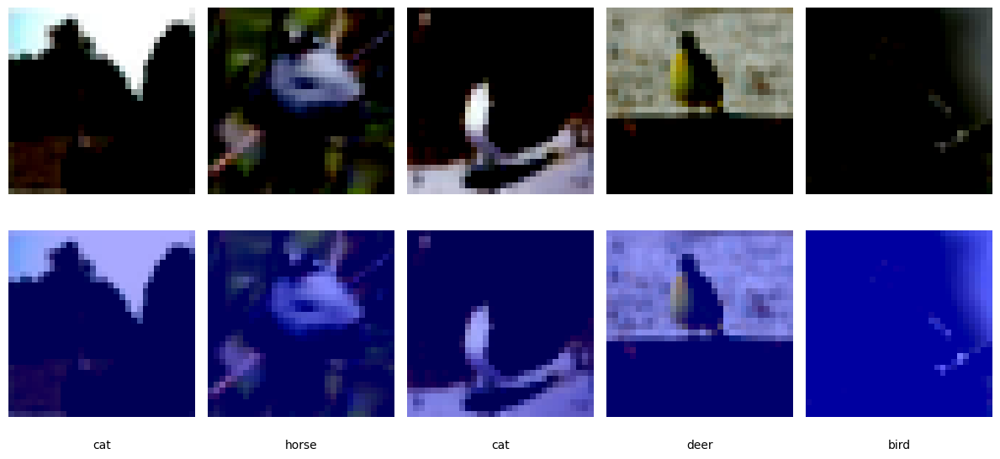



cat


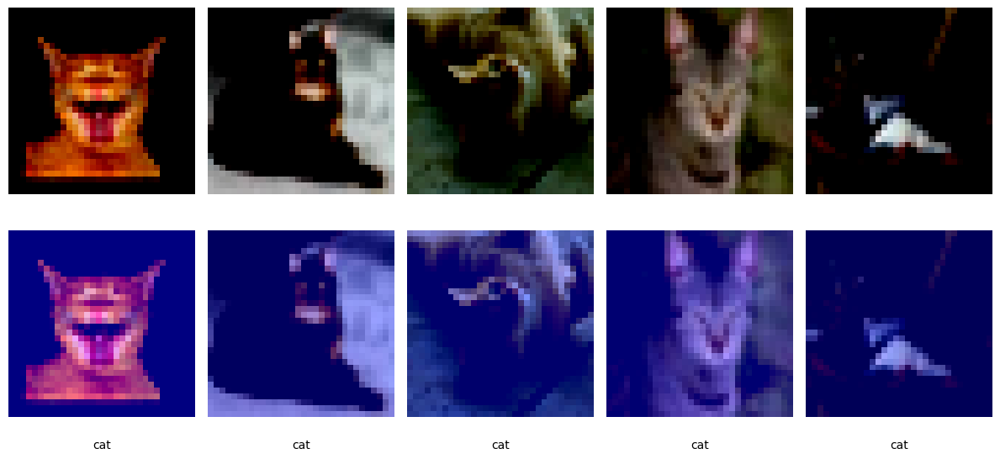



deer


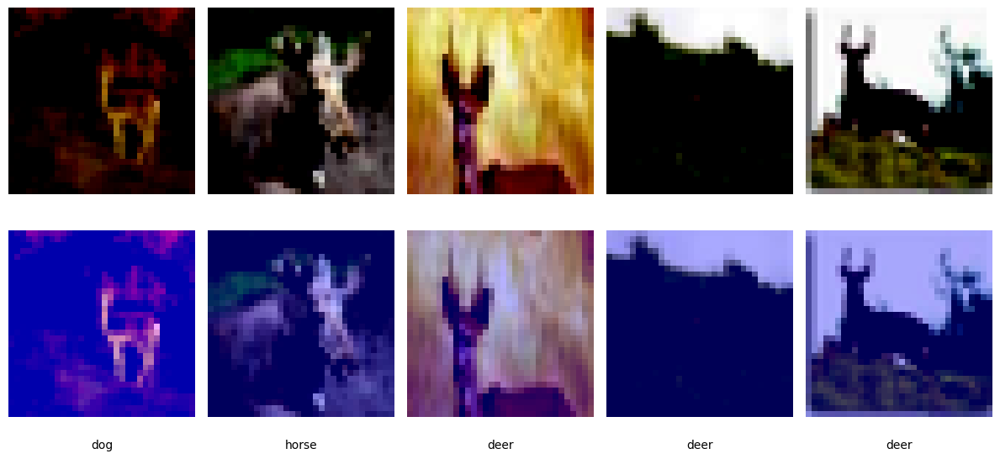



dog


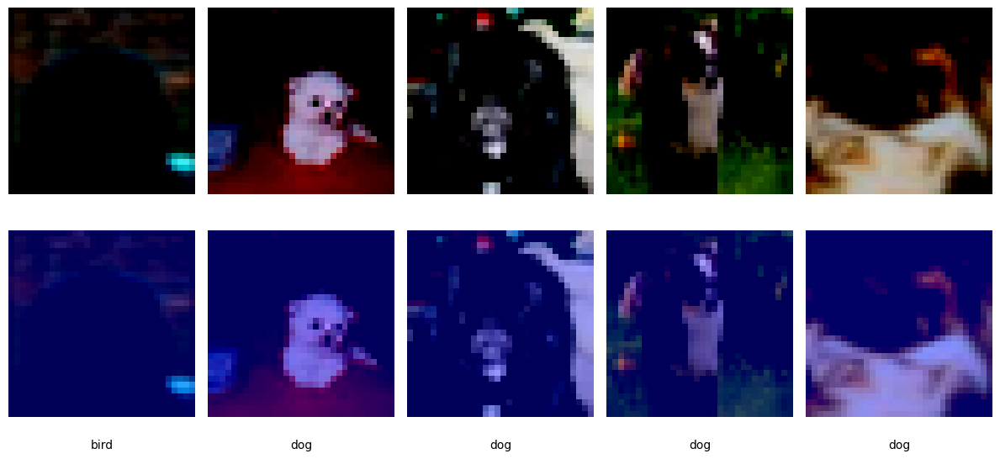



frog


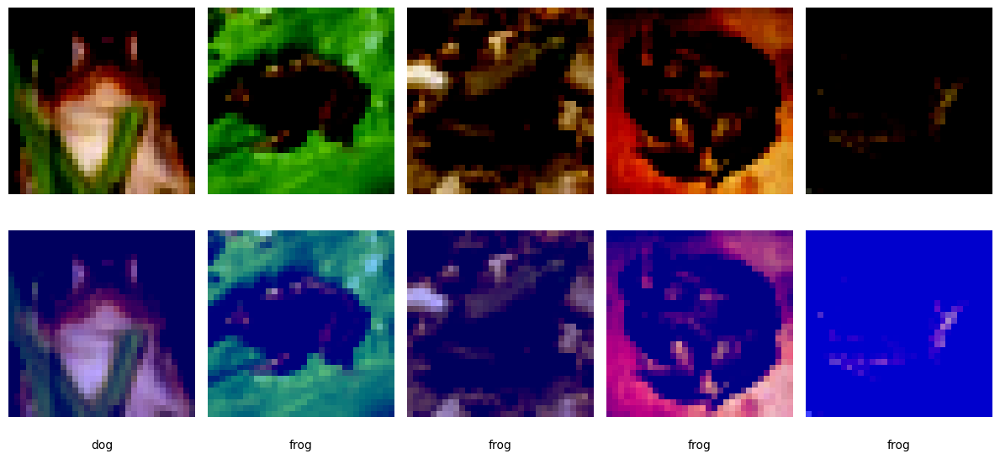



horse


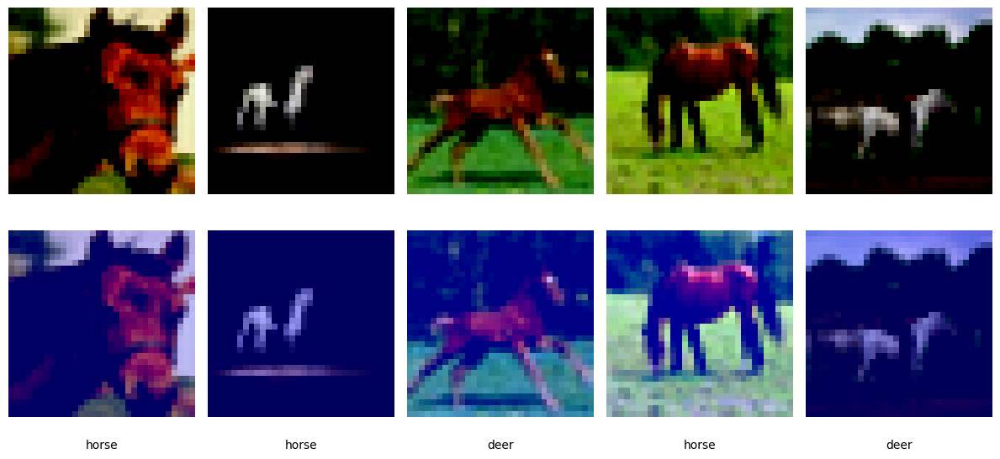



ship


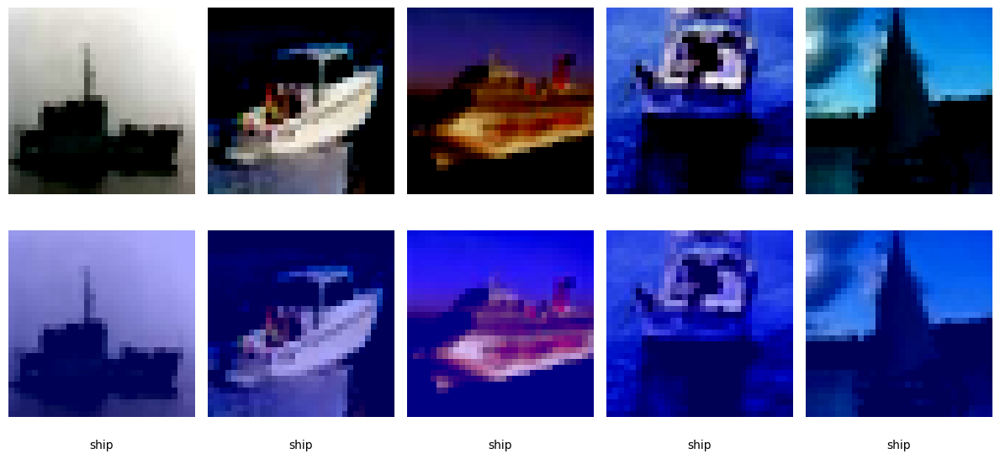



truck


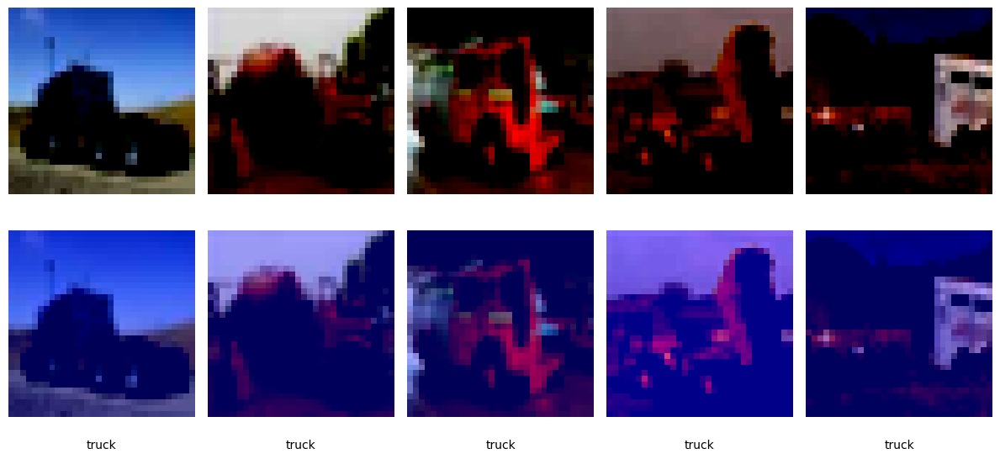

In [ ]:
for className in classes:
  DrawGradcamImgs(className)
  print('\n')

## input size = 224 x 224
## lr = 0.1
## optim = SGD, momentum = 0.9
## weight decay = 2e-05

airplane


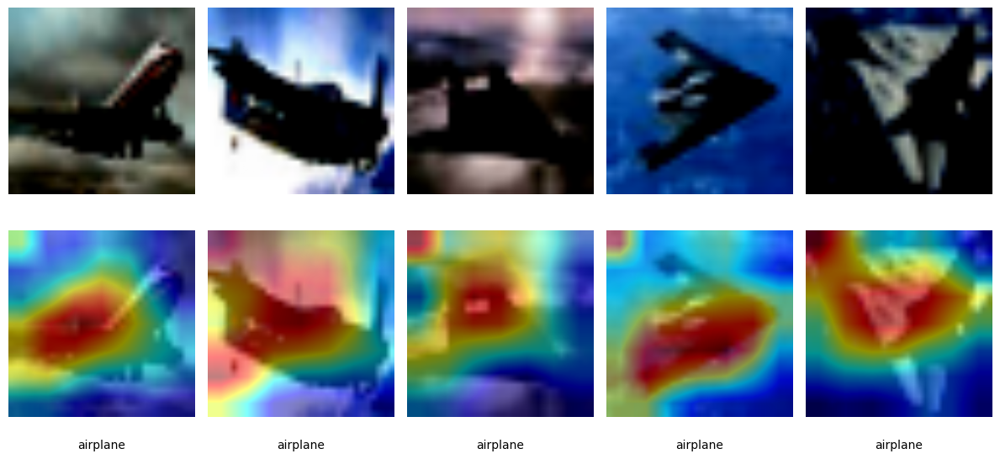



automobile


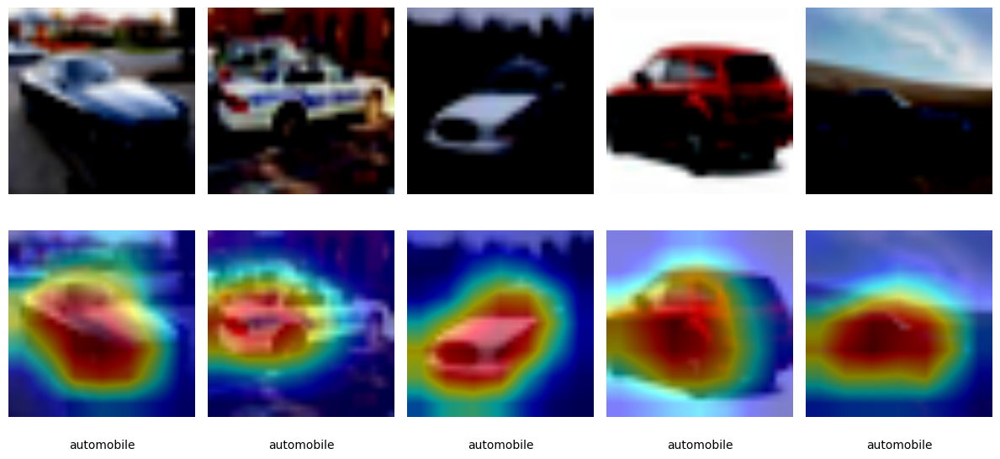



bird


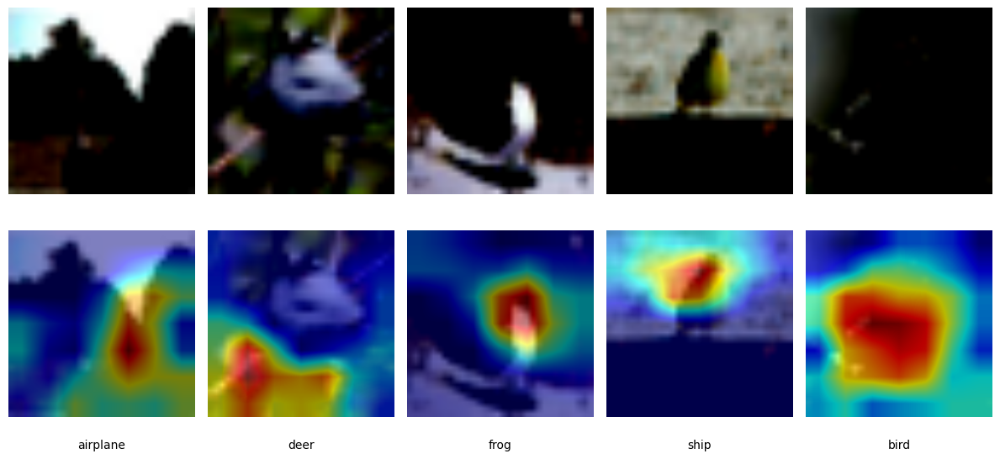



cat


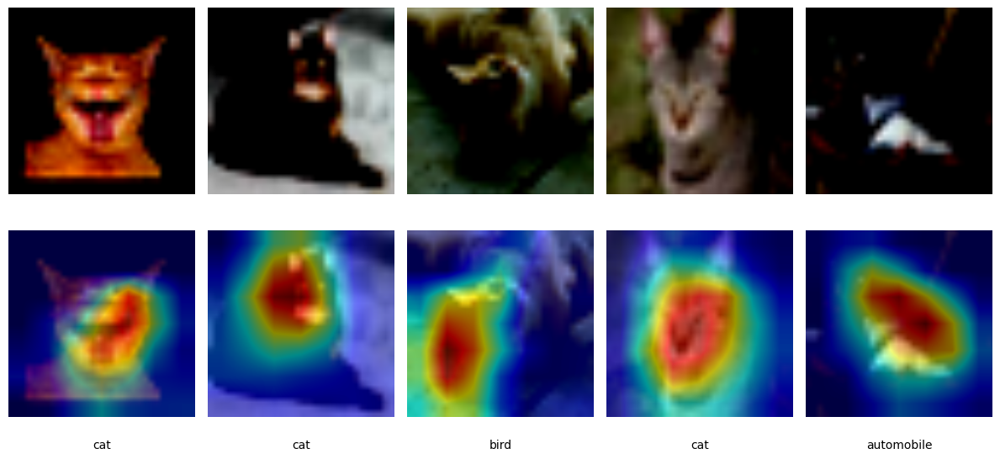



deer


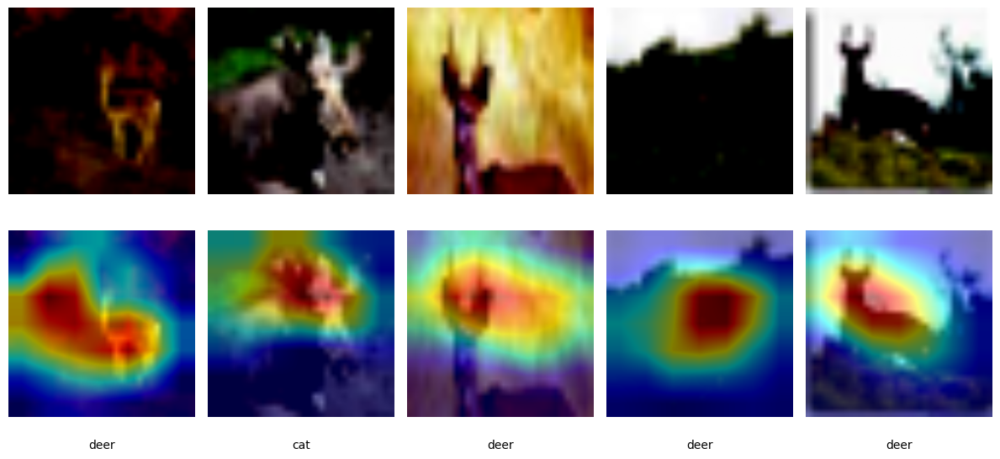



dog


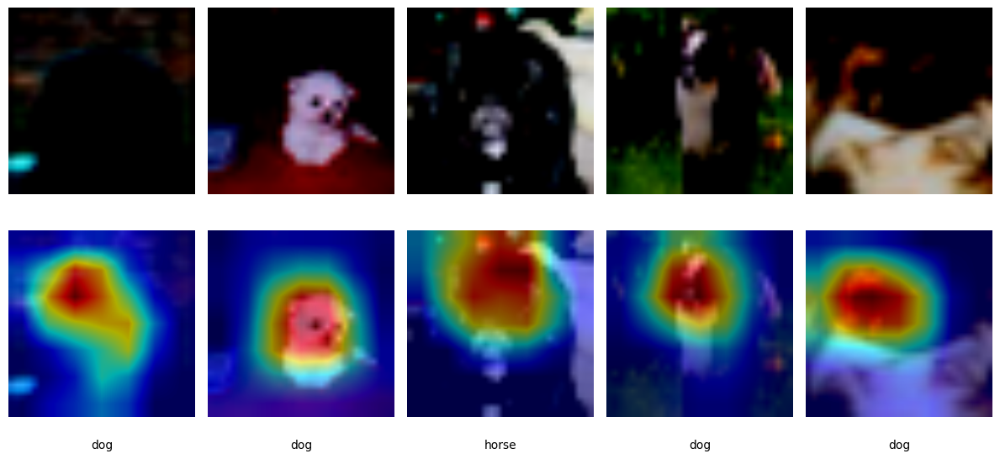



frog


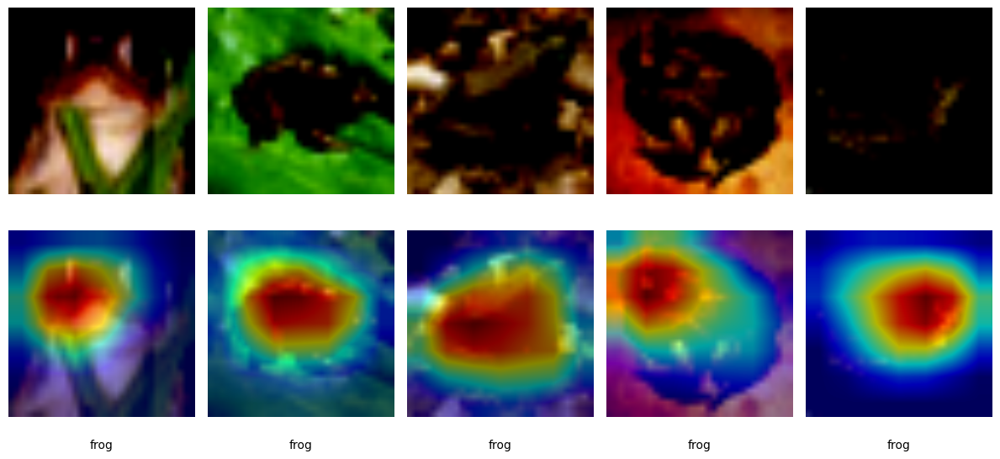



horse


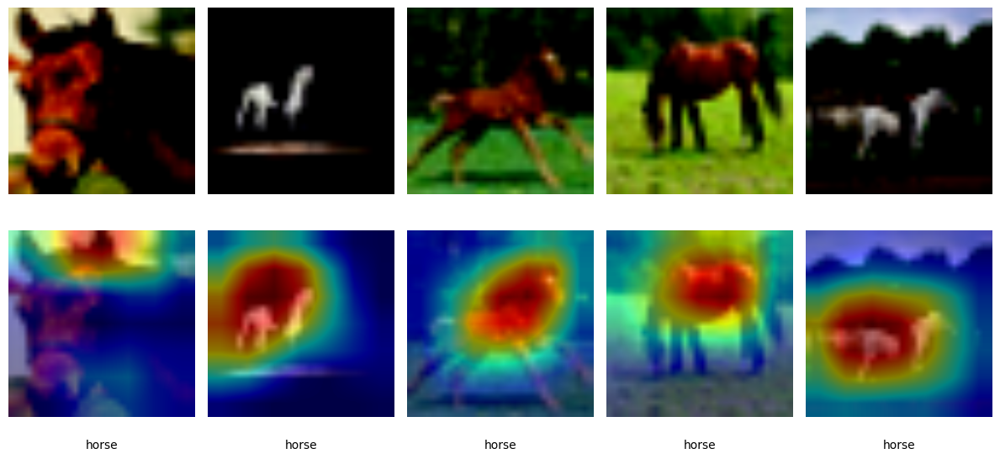



ship


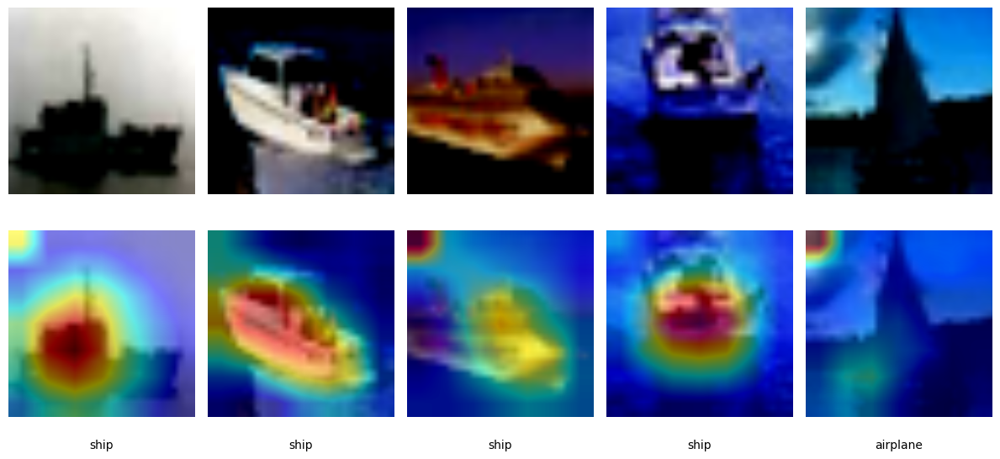



truck


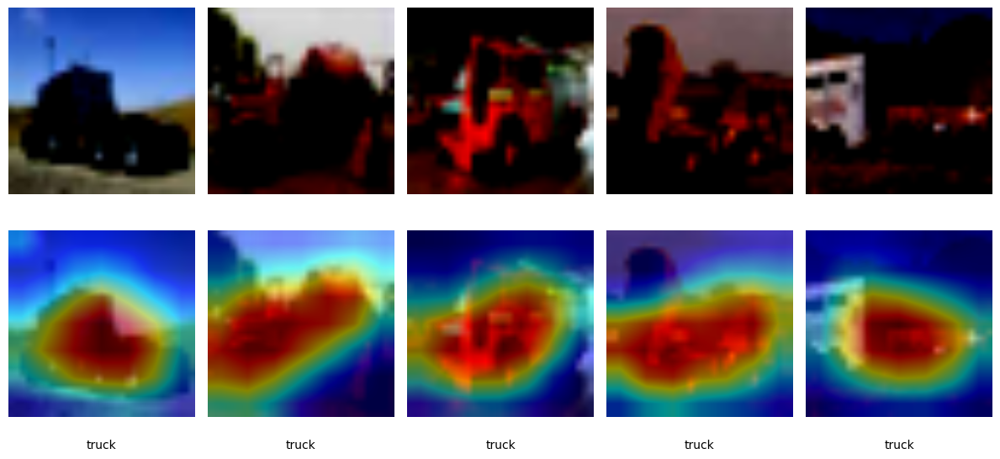

In [ ]:
for className in classes:
  DrawGradcamImgs(className)
  print('\n')

## Input size = 96x96
## lr = 0.05
## optim = SGD momentum = 0.9
## weight decay = 2e-05

airplane


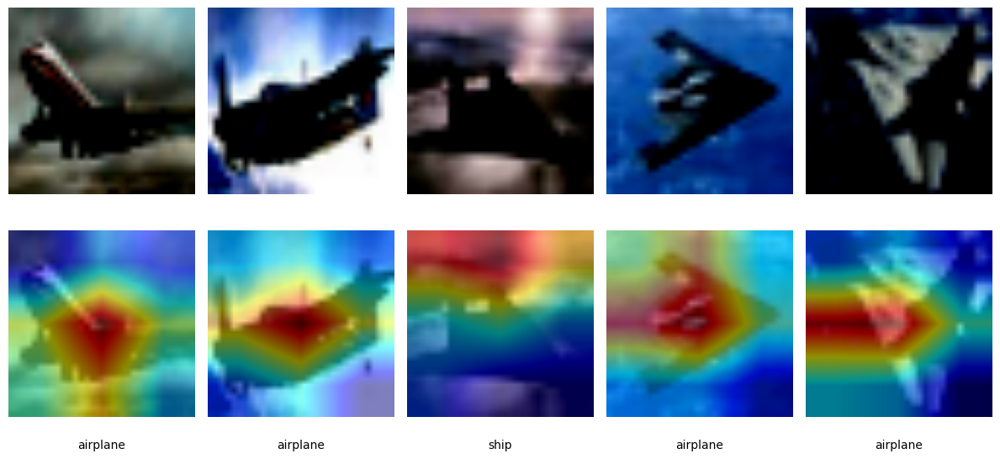



automobile


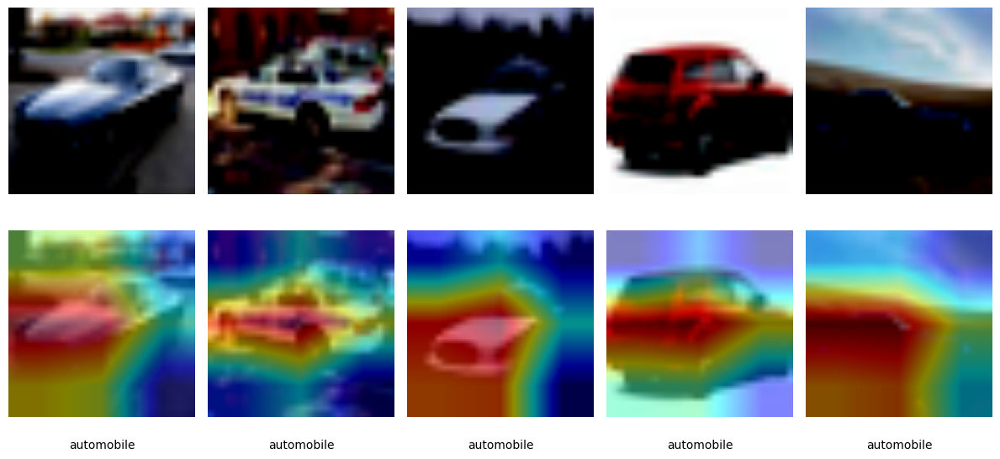



bird


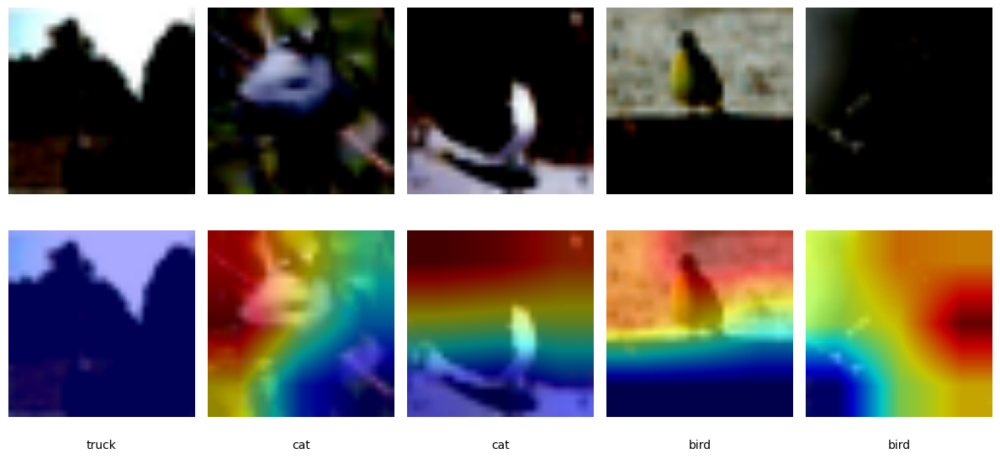



cat


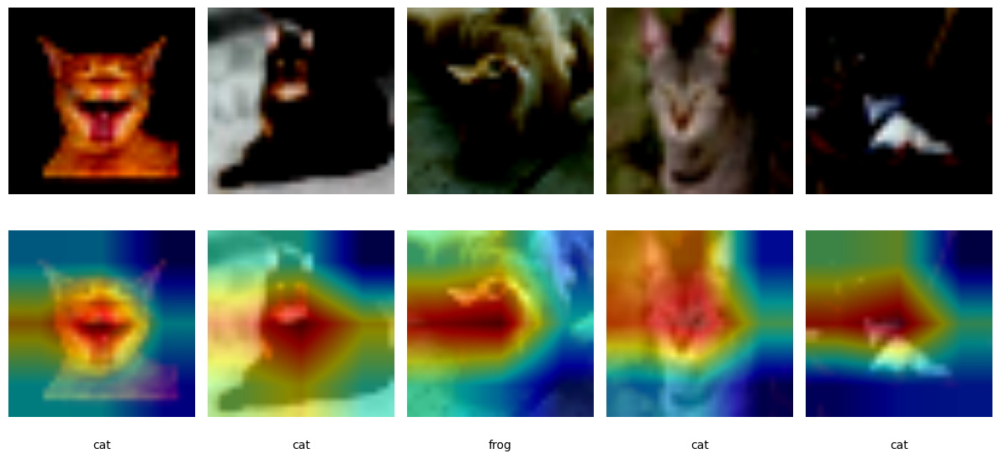



deer


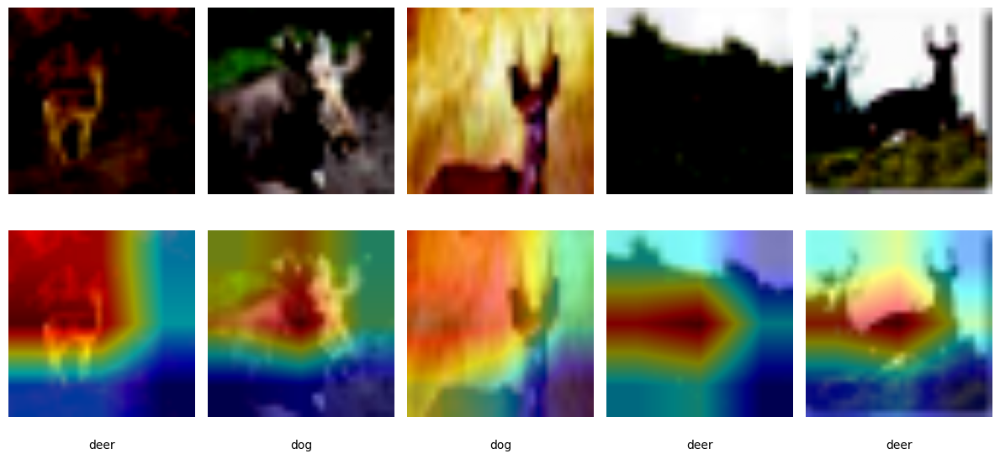



dog


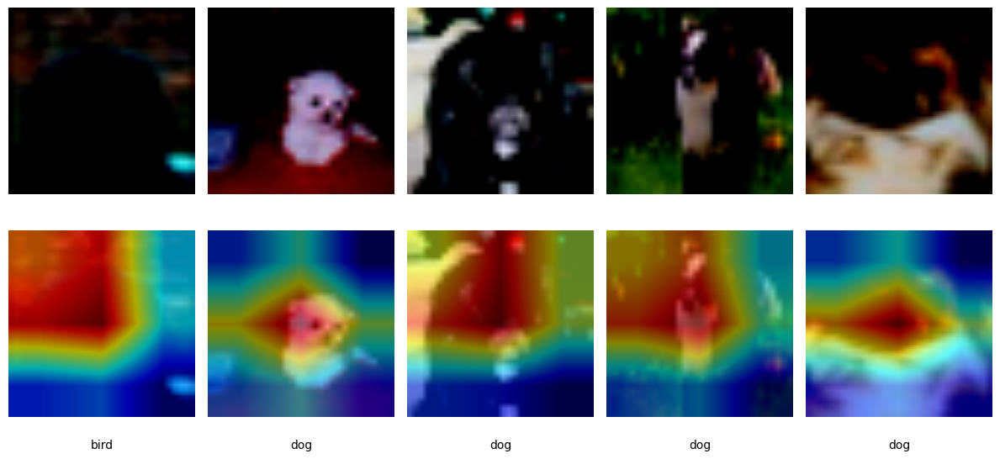



frog


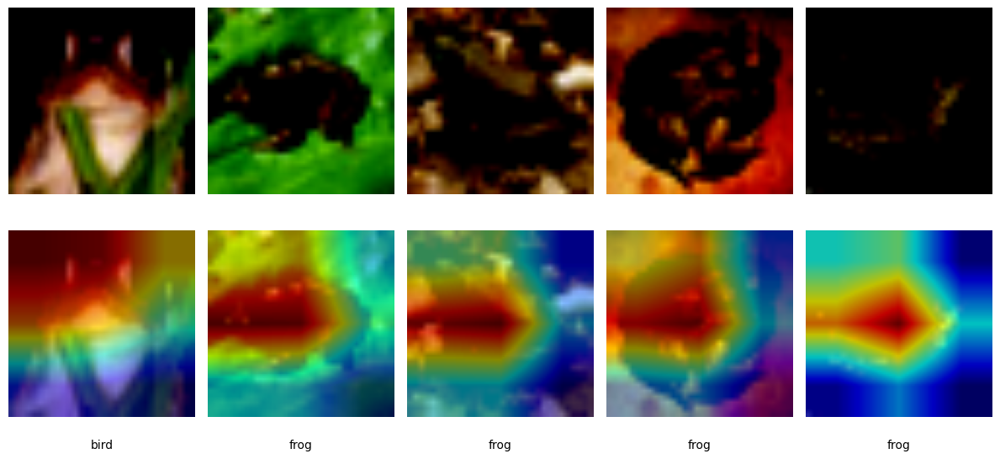



horse


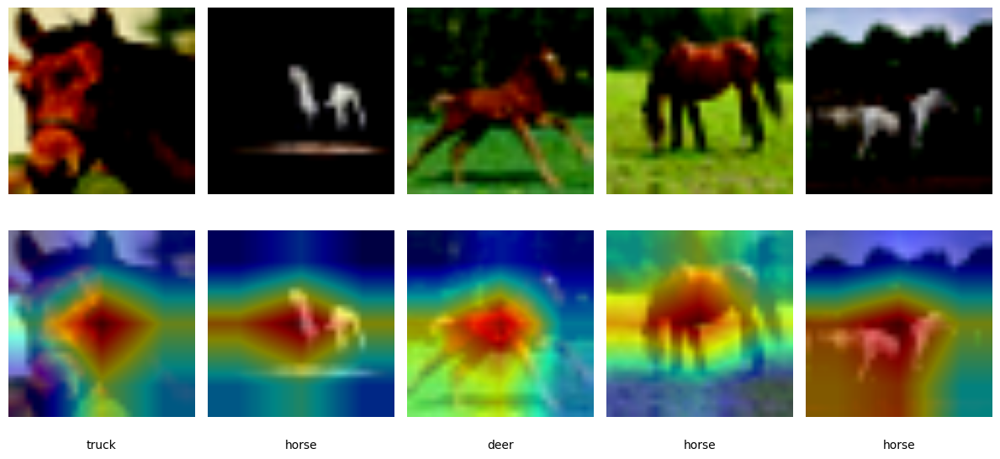



ship


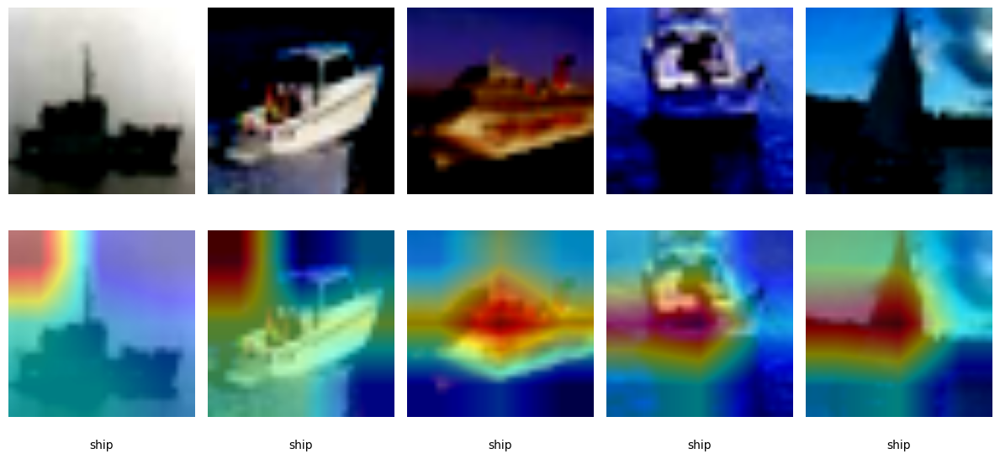



truck


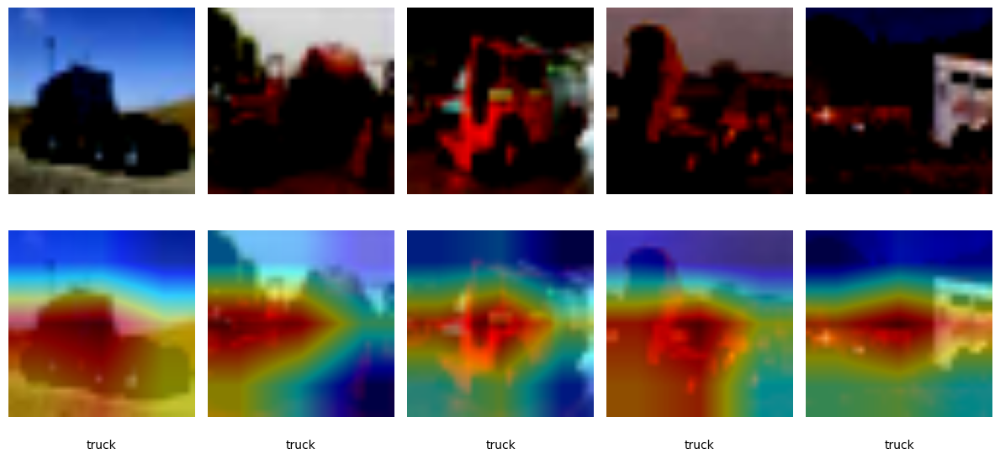

In [ ]:
for className in classes:
  DrawGradcamImgs(className)
  print('\n')

#deprecated

In [ ]:
def image_to_tensor(image: np.ndarray, range_norm: bool, half: bool) -> torch.Tensor:
    """Convert the image data type to the Tensor (NCWH) data type supported by PyTorch

    Args:
        image (np.ndarray): The image data read by ``OpenCV.imread``, the data range is [0,255] or [0, 1]
        range_norm (bool): Scale [0, 1] data to between [-1, 1]
        half (bool): Whether to convert torch.float32 similarly to torch.half type

    Returns:
        tensor (torch.Tensor): Data types supported by PyTorch

    Examples:
        >>> example_image = cv2.imread("example_image.bmp")
        >>> example_tensor = image_to_tensor(example_image, False, False)

    """
    # Convert image data type to Tensor data type
    tensor = F_vision.to_tensor(image)

    # Scale the image data from [0, 1] to [-1, 1]
    if range_norm:
        tensor = tensor.mul(2.0).sub(1.0)

    # Convert torch.float32 image data type to torch.half image data type
    if half:
        tensor = tensor.half()

    return tensor


def tensor_to_image(tensor: torch.Tensor, range_norm: bool, half: bool) -> Any:
    """Convert the Tensor(NCWH) data type supported by PyTorch to the np.ndarray(WHC) image data type

    Args:
        tensor (torch.Tensor): Data types supported by PyTorch (NCHW), the data range is [0, 1]
        range_norm (bool): Scale [-1, 1] data to between [0, 1]
        half (bool): Whether to convert torch.float32 similarly to torch.half type.

    Returns:
        image (np.ndarray): Data types supported by PIL or OpenCV

    Examples:
        >>> example_tensor = torch.randn([1,3, 256, 256], dtype=torch.float)
        >>> example_image = tensor_to_image(example_tensor, False, False)

    """
    # Scale the image data from [-1, 1] to [0, 1]
    if range_norm:
        tensor = tensor.add(1.0).div(2.0)

    # Convert torch.float32 image data type to torch.half image data type
    if half:
        tensor = tensor.half()

    image = tensor.squeeze(0).permute(1, 2, 0).mul(255).clamp(0, 255).cpu().numpy().astype("uint8")

    return image

def preprocess_image(image_path: str, image_size: int) -> torch.Tensor:
    image = cv2.imread(image_path)

    # BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # OpenCV convert PIL
    image = Image.fromarray(image)

    # Resize to 224
    image = Resize([image_size, image_size])(image)
    # Convert image data to pytorch format data
    tensor = image_to_tensor(image, False, False).unsqueeze_(0)
    # Convert a tensor image to the given ``dtype`` and scale the values accordingly
    tensor = ConvertImageDtype(torch.float)(tensor)
    # Normalize a tensor image with mean and standard deviation.
    tensor = Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(tensor)

    return tensor

In [ ]:
label_map = {
    'dog': 1,
    'cat': 0
}

class DogCatDataSet(Dataset):

  def __init__(self, image_size):
    total_data = os.listdir('/content/drive/MyDrive/spring/train')
    tensor_img = []
    label = []
    for name in total_data:
      annotate = name.split('.')
      img = cv2.imread(os.path.join('/content/drive/MyDrive/spring/train', name))
      tensor = preprocess_image(os.path.join('/content/drive/MyDrive/spring/train', name), image_size)
      tensor_img.append(tensor)
      label.append(label_map[annotate[0]])

    self.x = tensor_img
    self.y = label
    self.n_samples = len(total_data)


  def __len__(self):
    return len(self.n_samples)

  def __getitem__(self, index):
    return self.x[index], self.y[index]


In [ ]:
total_data = os.listdir('/content/drive/MyDrive/spring/train')
len(total_data)

10502

In [ ]:
cat_count = 0
dog_count = 0

for i in total_data:
    if i.startswith('cat.'):
        cat_count += 1
    elif i.startswith('dog.'):
        dog_count += 1


print(f"Number of dog images: {dog_count}")
print(f"Number of cat images: {cat_count}")

Number of dog images: 12500
Number of cat images: 12500


In [ ]:
base_dir = f"/content/drive/MyDrive/spring/dogs_vs_cats_dataset"
# os.mkdir(base_dir)

In [ ]:
# make an train dir
train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')
validate_dir = os.path.join(base_dir, 'val')

# create the directory
# os.mkdir(train_dir)
# os.mkdir(test_dir)
# os.mkdir(validate_dir)

In [ ]:
train_dog_dir = os.path.join(train_dir, 'dogs')
train_cat_dir = os.path.join(train_dir, 'cats')

# create an testing folders
test_dog_dir = os.path.join(test_dir, "dogs")
test_cat_dir = os.path.join(test_dir, "cats")

# create an validation folders
val_dog_dir = os.path.join(validate_dir, "dogs")
val_cat_dir = os.path.join(validate_dir, "cats")

# make training folders
# os.mkdir(train_dog_dir)
# os.mkdir(train_cat_dir)

# os.mkdir(test_dog_dir)
# os.mkdir(test_cat_dir)

# os.mkdir(val_dog_dir)
# os.mkdir(val_cat_dir)

In [ ]:
original_dataset = '/content/drive/MyDrive/spring/train'

fnames = [f'cat.{i}.jpg' for i in range(10001)]

for fname in fnames:
    src = os.path.join(original_dataset, fname)
    dst = os.path.join(train_cat_dir, fname)
    shutil.copyfile(src, dst)

fnames_cat_val = [f'cat.{i}.jpg' for i in range(10001, 11251)]

for fname in fnames_cat_val:
    src = os.path.join(original_dataset, fname)
    dst = os.path.join(val_cat_dir, fname)
    shutil.copyfile(src, dst)

fnames_cat_test = [f'cat.{i}.jpg' for i in range(11251, 12500)]

for fname in fnames_cat_test:
    src = os.path.join(original_dataset, fname)
    dst = os.path.join(test_cat_dir, fname)
    shutil.copyfile(src, dst)

In [ ]:
fnames_dog_train = [f'dog.{i}.jpg' for i in range(10001)]

for fname in fnames_dog_train:
    src = os.path.join(original_dataset, fname)
    dst = os.path.join(train_dog_dir, fname)
    shutil.copyfile(src, dst)

fnames_dog_val = [f'dog.{i}.jpg' for i in range(10001, 11251)]

for fname in fnames_dog_val:
    src = os.path.join(original_dataset, fname)
    dst = os.path.join(val_dog_dir, fname)
    shutil.copyfile(src, dst)

fnames_dog_test = [f'dog.{i}.jpg' for i in range(11251, 12500)]

for fname in fnames_dog_test:
    src = os.path.join(original_dataset, fname)
    dst = os.path.join(test_dog_dir, fname)
    shutil.copyfile(src, dst)

In [ ]:
print(f'Total training cat images {len(os.listdir(train_cat_dir))}')
print(f'Total validation cat images {len(os.listdir(val_cat_dir))}')
print(f'Total test cat images {len(os.listdir(test_cat_dir))}')
print('\n')
print(f'Total training dog images {len(os.listdir(train_dog_dir))}')
print(f'Total validation cat images {len(os.listdir(val_dog_dir))}')
print(f'Total test cat images {len(os.listdir(test_dog_dir))}')

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/spring/dogs_vs_cats_dataset/train/cats'

In [ ]:
image_size = 224
batch_size = 128
num_workers = 4
random.seed(42)

In [ ]:
data_transform = transforms.Compose([
    # resize the image into 256x256
    transforms.Resize(size=(image_size, image_size)),
    # flip the images randomly on horizontal
    transforms.RandomHorizontalFlip(p=0.5),
    # turn the image into a torch tensor
    transforms.ToTensor()
])

In [ ]:
train_data = datasets.ImageFolder(
    root=train_dir,
    transform=data_transform,
    target_transform=None
)

test_data = datasets.ImageFolder(
    root=test_dir,
    transform=data_transform,
)

In [ ]:
train_dataloader = DataLoader(
    dataset=train_data,
    batch_size=100,
    shuffle=True
)

test_dataloader = DataLoader(
    dataset=test_data,
    batch_size=100,
    shuffle=False
)

In [ ]:
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])
print("Image shape of a random sample image : {}".format(train_dataset[0][0].numpy().shape), end = '\n\n')

print("Training Set:   {} images".format(len(train_dataset)))
print("Validation Set:   {} images".format(len(val_dataset)))

In [ ]:
class ActivationsAndGradients:
    """ Class for extracting activations and
    registering gradients from targetted intermediate layers """

    def __init__(self, model, target_layers, reshape_transform):
        self.model = model
        self.gradients = []
        self.activations = []
        self.reshape_transform = reshape_transform
        self.handles = []
        for target_layer in target_layers:
            self.handles.append(
                target_layer.register_forward_hook(self.save_activation))
            # Because of https://github.com/pytorch/pytorch/issues/61519,
            # we don't use backward hook to record gradients.
            self.handles.append(
                target_layer.register_forward_hook(self.save_gradient))

    def save_activation(self, module, input, output):
        activation = output

        if self.reshape_transform is not None:
            activation = self.reshape_transform(activation)
        self.activations.append(activation.cpu().detach())

    def save_gradient(self, module, input, output):
        if not hasattr(output, "requires_grad") or not output.requires_grad:
            # You can only register hooks on tensor requires grad.
            return

        # Gradients are computed in reverse order
        def _store_grad(grad):
            if self.reshape_transform is not None:
                grad = self.reshape_transform(grad)
            self.gradients = [grad.cpu().detach()] + self.gradients

        output.register_hook(_store_grad)

    def __call__(self, x):
        self.gradients = []
        self.activations = []
        return self.model(x)

    def release(self):
        for handle in self.handles:
            handle.remove()

In [ ]:
import torch
import torch.nn as nn
from torchvision.models import resnet50
from torchvision.transforms import Resize, ToTensor

class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.resnet = resnet50(pretrained=True)
        self.activations_and_gradients = None

    def forward(self, x):
        # Pass the input through the ResNet model
        output = self.resnet(x)
        return output

    def register_activations_and_gradients(self, target_layers):
        self.activations_and_gradients = ActivationsAndGradients(
            self.resnet, target_layers, reshape_transform=None
        )

    def release_activations_and_gradients(self):
        if self.activations_and_gradients is not None:
            self.activations_and_gradients.release()

model = MyModel()
layer1 = model.resnet.layer1
layer2 = model.resnet.layer2
model.register_activations_and_gradients([layer1, layer2])

# Example input
input_image = torch.randn(1, 3, 224, 224)

# Forward pass
output = model(input_image)

# Retrieve activations
activations = model.activations_and_gradients.activations
print(activations)

# Retrieve gradients
gradients = model.activations_and_gradients.gradients
print(gradients)

# Release activations and gradients
model.release_activations_and_gradients()

[tensor([[[[3.8073e-01, 1.2031e-01, 4.6896e-03,  ..., 2.3101e-01,
           2.0192e-01, 1.9780e-02],
          [2.4256e-02, 6.3916e-03, 7.0136e-03,  ..., 5.8273e-03,
           7.4618e-03, 1.5757e-01],
          [1.0628e-01, 6.5314e-03, 5.0376e-03,  ..., 5.1636e-03,
           4.7433e-03, 7.6014e-03],
          ...,
          [9.4550e-02, 3.3403e-01, 5.2439e-03,  ..., 5.7242e-03,
           5.7414e-03, 5.0155e-03],
          [4.5695e-03, 8.9097e-02, 4.6632e-02,  ..., 5.3096e-03,
           1.3271e-02, 1.3844e-01],
          [1.8312e-02, 2.1048e-02, 2.5581e-02,  ..., 2.0645e-02,
           2.0897e-02, 2.7337e-02]],

         [[4.0700e-01, 2.3082e-01, 1.0728e-02,  ..., 3.7856e-01,
           2.1808e-01, 0.0000e+00],
          [1.2862e-01, 6.5090e-02, 6.0983e-03,  ..., 2.5074e-02,
           6.0142e-03, 1.8399e-01],
          [1.4078e-02, 1.2397e-02, 1.0396e-02,  ..., 1.3097e-02,
           1.2036e-02, 5.6001e-03],
          ...,
          [1.7824e-01, 1.6688e-01, 5.0367e-02,  ..., 1.070